In [1]:
#load relevant packages 
import numpy as np
import pandas as pd
import sys
import sklearn
import pyreadr
import itertools

import matplotlib as mpl
from matplotlib import pyplot as plt

from sklearn import metrics
from sklearn.preprocessing import StandardScaler

from numpy import random
import seaborn as sb
from scipy import linalg

In [2]:
## Load data
result = pyreadr.read_r('training_matched_final.rds')
df1 = result[None]

In [6]:
df1.columns

Index(['eid', 'WBC_count', 'red_blood_cell_count', 'haemoglobin_conc',
       'platelet_count', 'lymphocyte_count', 'monocyte_count',
       'neutrophil_count', 'eosinophil_count', 'basophil_count',
       'nucleated_rbc_count', 'reticulocyte_count', 'mean_cell_volume',
       'Smoke_status', 'Ethnicity', 'Alcohol_status', 'BMI',
       'Smoke_pack_years', 'date_diagnosis', 'date_death', 'time_to_diagnosis',
       'Sex', 'deprivation_score', 'Age_recr', 'case_status', 'date_recr',
       'Year_of_birth', 'treatment', 'year_recr', 'type', 'year_diagnosis',
       'days_since_diagnosis', 'distance', 'weights', 'subclass'],
      dtype='object')

In [3]:
#remove columns we don't want
df_processed = df1.drop(["date_recr","Year_of_birth","treatment","year_recr", "distance","weights","subclass"],axis=1)

In [4]:
df_processed.iloc[:,1:13].columns

Index(['WBC_count', 'red_blood_cell_count', 'haemoglobin_conc',
       'platelet_count', 'lymphocyte_count', 'monocyte_count',
       'neutrophil_count', 'eosinophil_count', 'basophil_count',
       'nucleated_rbc_count', 'reticulocyte_count', 'mean_cell_volume'],
      dtype='object')

# Gaussian Mixture Models 

In [5]:
#scales only BC data 
BC = df_processed.iloc[:,1:13]

# create scaler object
scaler = StandardScaler()

scaled_BC = scaler.fit_transform(BC)

In [6]:
from sklearn import mixture

In [7]:
# GMM code for multiple clusters and calculates BIC for each, before plotting the best one.
'''lowest_bic = np.infty
bic = []
n_components_range = range(1, 30)
cv_types = ['spherical', 'tied', 'diag', 'full']
for cv_type in cv_types:
    for n_components in n_components_range:
        
        # Fit a Gaussian mixture with EM
        gmm = mixture.GaussianMixture(n_components=n_components,
                                      covariance_type=cv_type)
        gmm.fit(scaled_BC)
        bic.append(gmm.bic(scaled_BC))
        if bic[-1] < lowest_bic:
            lowest_bic = bic[-1]
            best_gmm = gmm

bic = np.array(bic)
color_iter = itertools.cycle(['navy', 'turquoise', 'cornflowerblue',
                              'darkorange'])
clf = best_gmm
bars = []

# Plot the BIC scores
plt.figure(figsize=(8, 6))
spl = plt.subplot(2, 1, 1)
for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range) + .2 * (i - 2)
    bars.append(plt.bar(xpos, bic[i * len(n_components_range):
                                  (i + 1) * len(n_components_range)],
                        width=.2, color=color))
plt.xticks(n_components_range)
plt.ylim([bic.min() * 1.01 - .01 * bic.max(), bic.max()])
plt.title('BIC score per model')
xpos = np.mod(bic.argmin(), len(n_components_range)) + .65 +\
    .2 * np.floor(bic.argmin() / len(n_components_range))
plt.text(xpos, bic.min() * 0.97 + .03 * bic.max(), '*', fontsize=14)
spl.set_xlabel('Number of components')
spl.legend([b[0] for b in bars], cv_types)

# Plot the winner
splot = plt.subplot(2, 1, 2)
Y_ = clf.predict(scaled_BC)
for i, (mean, cov, color) in enumerate(zip(clf.means_, clf.covariances_,
                                           color_iter)):
    v, w = linalg.eigh(cov)
    if not np.any(Y_ == i):
        continue
    plt.scatter(scaled_BC[Y_ == i, 0], scaled_BC[Y_ == i, 1], .8, color=color)

    # Plot an ellipse to show the Gaussian component
    angle = np.arctan2(w[0][1], w[0][0])
    angle = 180. * angle / np.pi  # convert to degrees
    v = 2. * np.sqrt(2.) * np.sqrt(v)
    ell = mpl.patches.Ellipse(mean, v[0], v[1], 180. + angle, color=color)
    ell.set_clip_box(splot.bbox)
    ell.set_alpha(.5)
    splot.add_artist(ell)

plt.xticks(())
plt.yticks(())
plt.title('Selected GMM: full model, 6 components')
plt.subplots_adjust(hspace=.35, bottom=.02)
plt.show()'''

"lowest_bic = np.infty\nbic = []\nn_components_range = range(1, 30)\ncv_types = ['spherical', 'tied', 'diag', 'full']\nfor cv_type in cv_types:\n    for n_components in n_components_range:\n        \n        # Fit a Gaussian mixture with EM\n        gmm = mixture.GaussianMixture(n_components=n_components,\n                                      covariance_type=cv_type)\n        gmm.fit(scaled_BC)\n        bic.append(gmm.bic(scaled_BC))\n        if bic[-1] < lowest_bic:\n            lowest_bic = bic[-1]\n            best_gmm = gmm\n\nbic = np.array(bic)\ncolor_iter = itertools.cycle(['navy', 'turquoise', 'cornflowerblue',\n                              'darkorange'])\nclf = best_gmm\nbars = []\n\n# Plot the BIC scores\nplt.figure(figsize=(8, 6))\nspl = plt.subplot(2, 1, 1)\nfor i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):\n    xpos = np.array(n_components_range) + .2 * (i - 2)\n    bars.append(plt.bar(xpos, bic[i * len(n_components_range):\n                               

6 components seems to be the where we start getting diminishing returns, so let's use 6 clusterds in our final model, with a 'full' hyperparameter.

In [13]:
bic_scores = []

for n_components in range(1, 11):
    gmm = mixture.GaussianMixture(n_components=n_components,covariance_type="full",random_state=4)
    gmm.fit(scaled_BC)
    bic_scores.append(gmm.bic(scaled_BC))

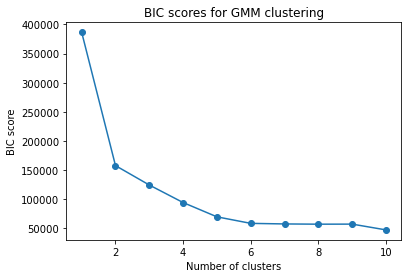

In [14]:
plt.plot(range(1, 11), bic_scores, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('BIC score')
plt.title('BIC scores for GMM clustering')
plt.show()

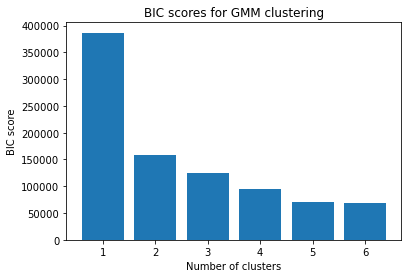

In [10]:
plt.bar(range(1, 7), bic_scores)
plt.xlabel('Number of clusters')
plt.ylabel('BIC score')
plt.title('BIC scores for GMM clustering')
plt.show()

In [6]:
#GMM with optimum model
gmm_optimumBC = mixture.GaussianMixture(
        n_components=6, covariance_type='full',random_state=1).fit(scaled_BC)

y_gmm_pred_optimumBC = gmm_optimumBC.predict(scaled_BC)

NameError: name 'mixture' is not defined

In [14]:
#adds cluster column with cluster indication to df_processed
df_processed['cluster'] = y_gmm_pred_optimumBC

In [15]:
#counts number of samples in each cluster
df_processed['cluster'].value_counts()

3    6065
2    4502
1    2506
5    1911
0     548
4      36
Name: cluster, dtype: int64

In [16]:
df_processed.columns

Index(['eid', 'WBC_count', 'red_blood_cell_count', 'haemoglobin_conc',
       'platelet_count', 'lymphocyte_count', 'monocyte_count',
       'neutrophil_count', 'eosinophil_count', 'basophil_count',
       'nucleated_rbc_count', 'reticulocyte_count', 'mean_cell_volume',
       'Smoke_status', 'Ethnicity', 'Alcohol_status', 'BMI',
       'Smoke_pack_years', 'date_diagnosis', 'date_death', 'time_to_diagnosis',
       'Sex', 'deprivation_score', 'Age_recr', 'case_status', 'type',
       'year_diagnosis', 'days_since_diagnosis', 'cluster'],
      dtype='object')

KeyboardInterrupt: 

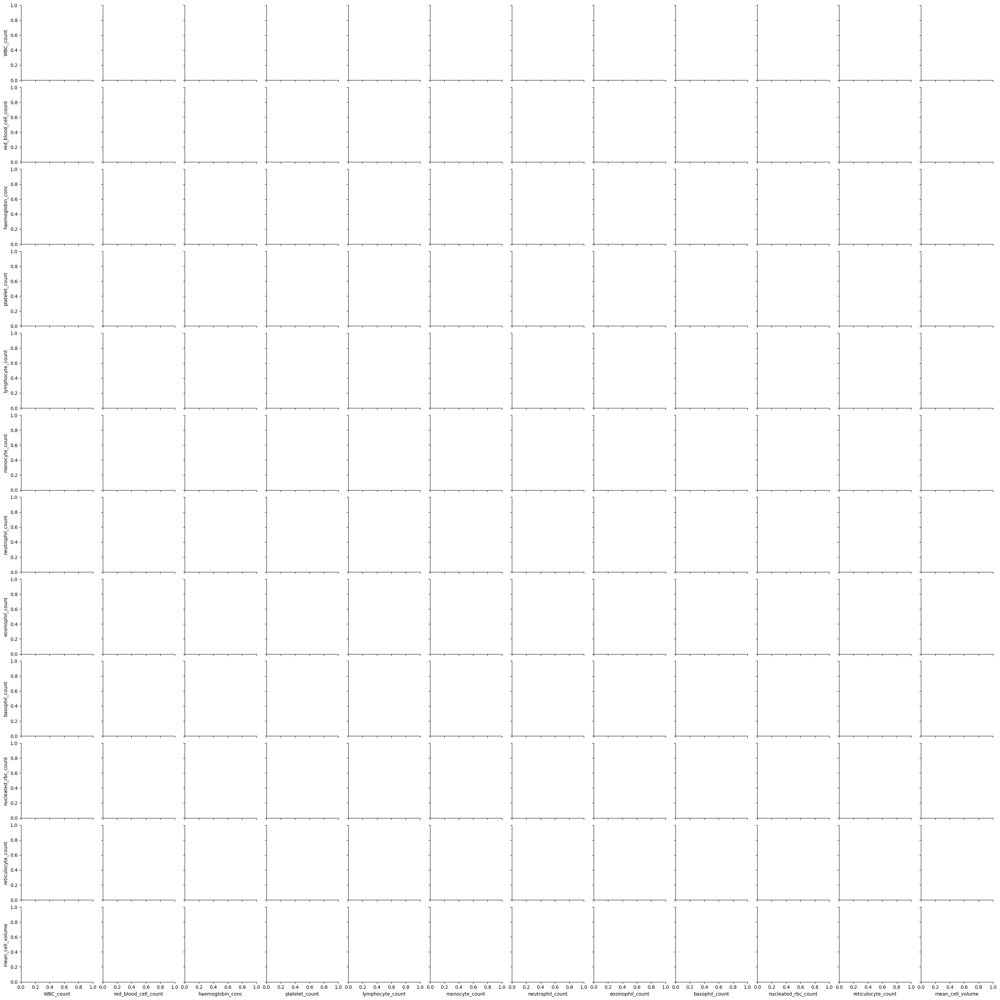

In [35]:
#plots each blood cell count column against the other, colour coded by cluster membership. 
sb.pairplot(df_processed.iloc[:,list(range(12)) + [-1]],hue="cluster")

In [ ]:
#plots each column against the other colour coded by cluster membership

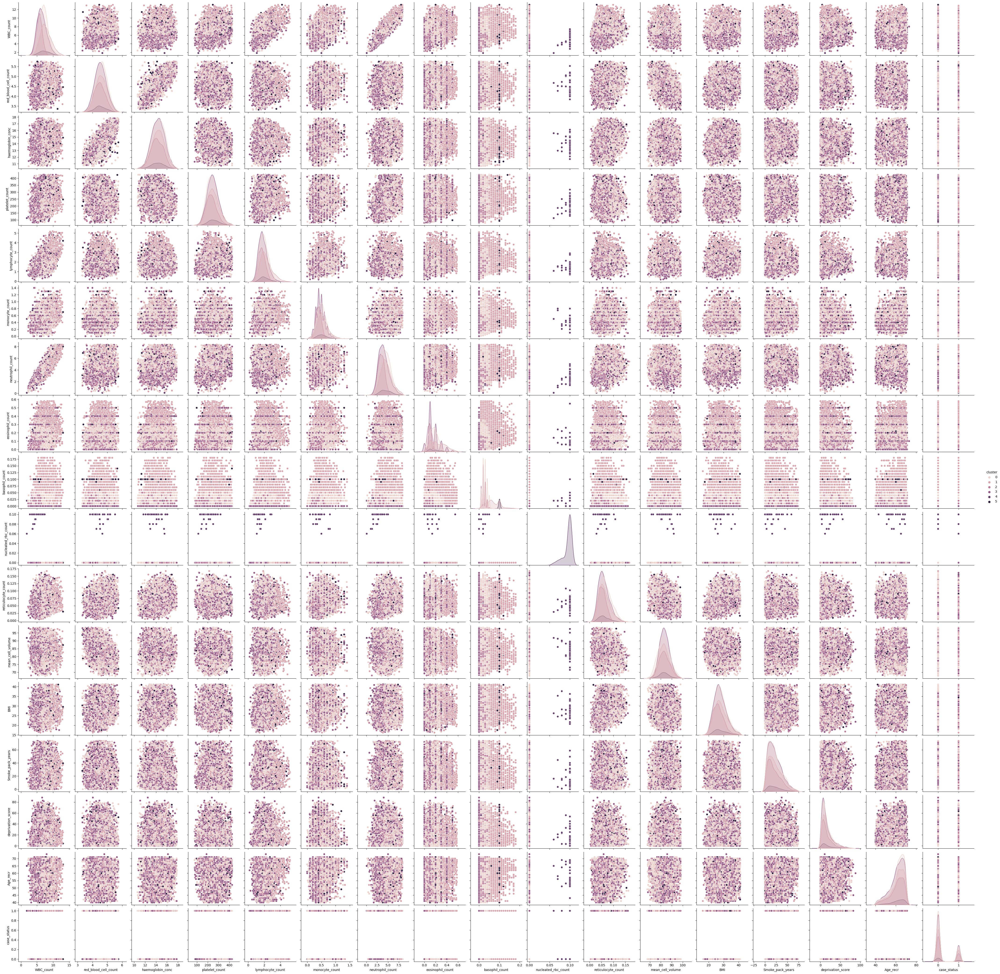

In [10]:
sb.pairplot(df_processed,hue="cluster")

# Biological interpretation of cluster membership

So we have our data now, and we can see which observation belongs to which cluster. Can we set up a multinomial logistic regression to see which variables are associated with cluster membership?

In [11]:
df_processed.columns

Index(['WBC_count', 'red_blood_cell_count', 'haemoglobin_conc',
       'platelet_count', 'lymphocyte_count', 'monocyte_count',
       'neutrophil_count', 'eosinophil_count', 'basophil_count',
       'nucleated_rbc_count', 'reticulocyte_count', 'mean_cell_volume',
       'Smoke_status', 'Ethnicity', 'Alcohol_status', 'BMI',
       'Smoke_pack_years', 'Sex', 'deprivation_score', 'Age_recr',
       'case_status', 'type', 'cluster'],
      dtype='object')

In [12]:
df_processed

,WBC_count,red_blood_cell_count,haemoglobin_conc,platelet_count,lymphocyte_count,monocyte_count,neutrophil_count,eosinophil_count,basophil_count,nucleated_rbc_count,...,Ethnicity,Alcohol_status,BMI,Smoke_pack_years,Sex,deprivation_score,Age_recr,case_status,type,cluster
0,6.90,4.700,15.90,212.0,1.40,0.40,5.00,0.00,0.00,0.0,...,1,1,29.5254,41.250,1,16.9625,63.0,0.0,NaN,3
1,7.65,5.007,16.01,251.1,2.00,0.68,4.55,0.34,0.08,0.0,...,1,1,32.9796,18.000,1,3.0900,70.0,0.0,NaN,1
2,4.50,4.170,13.70,286.0,1.70,0.40,2.30,0.00,0.00,0.0,...,1,1,20.8999,28.750,0,7.1900,57.0,0.0,NaN,3
3,5.00,4.440,12.90,346.0,1.60,0.50,2.80,0.10,0.00,0.0,...,1,1,25.5132,63.750,0,6.3100,59.0,1.0,Lymphoma,3
4,7.73,4.305,14.18,408.3,2.72,0.67,4.15,0.17,0.03,0.0,...,1,1,24.4389,44.500,0,3.7900,58.0,0.0,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15563,5.56,4.497,14.82,182.9,1.09,0.41,4.02,0.03,0.02,0.0,...,1,1,26.9863,20.250,1,15.0200,69.0,1.0,Chronic_myeloprolif,2
15564,6.00,4.232,14.74,168.2,1.63,0.35,3.92,0.09,0.02,0.0,...,4,1,31.5533,19.125,1,17.9600,68.0,0.0,NaN,2
15565,8.50,4.514,13.78,243.7,3.19,0.56,4.59,0.12,0.04,0.0,...,1,2,33.4141,32.000,0,2.6800,70.0,0.0,NaN,0
15566,8.90,4.990,15.40,313.0,2.50,0.20,6.00,0.10,0.10,0.0,...,1,1,25.8746,50.000,1,53.4100,58.0,1.0,Chronic_myeloprolif,1


In [11]:
# count NAs in df1
na_counts = df_processed.isna().sum()

# print the results
for col_name, na_count in na_counts.iteritems():
    print(f"{col_name}: {na_count}")

WBC_count: 0
red_blood_cell_count: 0
haemoglobin_conc: 0
platelet_count: 0
lymphocyte_count: 0
monocyte_count: 0
neutrophil_count: 0
eosinophil_count: 0
basophil_count: 0
nucleated_rbc_count: 0
reticulocyte_count: 0
mean_cell_volume: 0
Smoke_status: 0
Ethnicity: 0
Alcohol_status: 0
BMI: 0
Smoke_pack_years: 0
Sex: 0
deprivation_score: 0
Age_recr: 0
case_status: 0
type: 11676
cluster: 0


/var/tmp/pbs.7145299.pbs/ipykernel_5164/1396074506.py:5: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for col_name, na_count in na_counts.iteritems():


In [13]:
df_processed.dtypes

WBC_count                float64
red_blood_cell_count     float64
haemoglobin_conc         float64
platelet_count           float64
lymphocyte_count         float64
monocyte_count           float64
neutrophil_count         float64
eosinophil_count         float64
basophil_count           float64
nucleated_rbc_count      float64
reticulocyte_count       float64
mean_cell_volume         float64
Smoke_status            category
Ethnicity               category
Alcohol_status          category
BMI                      float64
Smoke_pack_years         float64
Sex                     category
deprivation_score        float64
Age_recr                 float64
case_status              float64
type                      object
cluster                    int64
dtype: object

In [17]:
#replace NA values in type column with 'None'

df_processed['type'] = df_processed['type'].fillna('None')

In [18]:
# count NAs in df1
na_counts = df_processed.isna().sum()

# print the results
for col_name, na_count in na_counts.iteritems():
    print(f"{col_name}: {na_count}")

eid: 0
WBC_count: 0
red_blood_cell_count: 0
haemoglobin_conc: 0
platelet_count: 0
lymphocyte_count: 0
monocyte_count: 0
neutrophil_count: 0
eosinophil_count: 0
basophil_count: 0
nucleated_rbc_count: 0
reticulocyte_count: 0
mean_cell_volume: 0
Smoke_status: 0
Ethnicity: 0
Alcohol_status: 0
BMI: 0
Smoke_pack_years: 0
date_diagnosis: 11676
date_death: 13690
time_to_diagnosis: 11676
Sex: 0
deprivation_score: 0
Age_recr: 0
case_status: 0
type: 0
year_diagnosis: 11676
days_since_diagnosis: 11676
cluster: 0


/var/tmp/pbs.7241863.pbs/ipykernel_3971385/1396074506.py:5: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for col_name, na_count in na_counts.iteritems():


For variables that have more than 2 levels, we need to encode them as dummy variables.

In [37]:
#creates new dataframe, converting appropriate variables to dummies
df_logistic = pd.get_dummies(df_processed, columns=['Smoke_status', 'Ethnicity','Alcohol_status','type'], drop_first=True)

In [14]:
df_logistic.dtypes

WBC_count                          float64
red_blood_cell_count               float64
haemoglobin_conc                   float64
platelet_count                     float64
lymphocyte_count                   float64
monocyte_count                     float64
neutrophil_count                   float64
eosinophil_count                   float64
basophil_count                     float64
nucleated_rbc_count                float64
reticulocyte_count                 float64
mean_cell_volume                   float64
BMI                                float64
Smoke_pack_years                   float64
Sex                               category
deprivation_score                  float64
Age_recr                           float64
case_status                        float64
cluster                              int64
Smoke_status_2                       uint8
Smoke_status_3                       uint8
Ethnicity_2                          uint8
Ethnicity_3                          uint8
Ethnicity_4

In [15]:
from sklearn.linear_model import LogisticRegression
# define the multinomial logistic regression model
logmodel = LogisticRegression(multi_class='multinomial', solver='newton-cg',max_iter=200)

Let's do cross-validation to optimise the logistic regression model

In [16]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

# define the model evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=1)

#creates predictor dataframe with all variables except cluster column
X = df_logistic.loc[:,df_logistic.columns!='cluster']

#creates y dataframe with cluster membership as outcome
y = df_logistic['cluster']

In [ ]:
# evaluate the model and collect the accuracy scores
n_scores = cross_val_score(logmodel, X, y, scoring='accuracy', cv=cv, n_jobs=-1)

In [53]:
n_scores

array([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan])

so the model doesn't work atm, what if we try standardising the data?

In [55]:
X = StandardScaler().fit_transform(X)

In [60]:
n_scores = cross_val_score(logmodel, X, y, scoring='accuracy', cv=cv, n_jobs=-1)
n_scores

array([0.83911368, 0.84521516, 0.84393064, 0.83938323, 0.84420173,
       0.84200385, 0.84938985, 0.83847142, 0.84612914, 0.83841953,
       0.84007707, 0.84649968, 0.84296724, 0.83681336, 0.84452297])

this shows us the accuracy of each model, but we want to look at the f1 score as we have some clusters with much smaller numbers

In [61]:
# report the model performance using f1 score

from sklearn.metrics import make_scorer, f1_score
# Create a scoring metric for F1 score with weighted averaging
f1_scorer = make_scorer(f1_score, average='weighted')
# Fit and evaluate the model using cross-validation
f1_scores = cross_val_score(logmodel, X, y, scoring=f1_scorer, cv=cv, n_jobs=-1)

f1_scores

array([0.82741234, 0.83291286, 0.83217084, 0.82780953, 0.83132588,
       0.82986659, 0.83765248, 0.8264199 , 0.83299649, 0.82706321,
       0.82859242, 0.83415926, 0.83078328, 0.82506124, 0.83261394])

Let's try tuning the parameters of the logistic regression model. 

In [5]:
from sklearn.model_selection import GridSearchCV

#THIS TAKES AGES TO RUN AND GIVES A LOT OF WARNINGS!!!!
# Define the parameter grid
param_grid = {'penalty': ['l1', 'l2', 'elasticnet', 'none'],
              'C': [0.001, 0.01, 0.1, 1, 10, 100],
              'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
              'max_iter': [100, 500, 1000,4000]}

# Create a GridSearchCV object with the logistic regression model and the parameter grid
grid_search = GridSearchCV(LogisticRegression(multi_class='multinomial'),
                           param_grid, cv=cv, n_jobs=-1, scoring='f1_weighted')

# Fit the GridSearchCV object to the data
grid_search.fit(X, y)

# Print the best hyperparameters and the associated mean test score
print('Best hyperparameters:', grid_search.best_params_)
print('Best test score:', grid_search.best_score_)

NameError: name 'LogisticRegression' is not defined

Now we've got the best hyperparameters for the log model, let's try on the test set, and find out what variables are important!

In [64]:
# defines optimial multinomial logistic regression model
optimum_logmodel = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=200, C=0.001,penalty='none')

In [67]:
X_train = X
y_train = y

In [69]:
optimum_logmodel.fit(X_train,y_train)

/rds/general/user/jt1019/home/anaconda3/envs/test1/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1173: FutureWarning: `penalty='none'`has been deprecated in 1.2 and will be removed in 1.4. To keep the past behaviour, set `penalty=None`.
  warnings.warn(
/rds/general/user/jt1019/home/anaconda3/envs/test1/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/rds/general/user/jt1019/home/anaconda3/envs/test1/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_i

LogisticRegression(C=0.001, max_iter=200, multi_class='multinomial',
                   penalty='none')

In [88]:
# Create a new DataFrame with the same column names as X_train
X_train_df = pd.DataFrame(X_train, columns=df_logistic.loc[:, df_logistic.columns != 'cluster'].columns)

In [89]:
# Create the coefs DataFrame
coefs = pd.DataFrame(optimum_logmodel.coef_, columns=X_train_df.columns)

In [97]:
#displays all columns in coefs
pd.set_option('display.max_columns', None)
coefs

,WBC_count,red_blood_cell_count,haemoglobin_conc,platelet_count,lymphocyte_count,monocyte_count,neutrophil_count,eosinophil_count,basophil_count,nucleated_rbc_count,reticulocyte_count,mean_cell_volume,BMI,Smoke_pack_years,Sex,deprivation_score,Age_recr,case_status,Smoke_status_2,Smoke_status_3,Ethnicity_2,Ethnicity_3,Ethnicity_4,Alcohol_status_2,Alcohol_status_3,type_Leukaemia,type_Lymphoma,type_Myelodysplastic_syndromes,type_Myelofibrosis,type_Myeloma,type_None,type_Polycythaemia_vera,type_Thrombocythaemia
0,-1.219290,1.408481,-1.083204,-0.138052,0.423908,0.378118,1.200227,-0.336428,17.944921,-1.505689,0.028299,0.145140,0.086401,0.005809,-0.193670,-0.005491,-0.104253,-0.003561,0.287166,0.342888,-0.108943,0.053710,0.014069,0.022291,0.050224,0.022092,-0.022543,-0.061535,-0.036092,-0.184286,0.003561,0.058054,0.282117
1,17.760556,1.001908,-0.794148,-0.277887,-6.102283,-1.804840,-13.636032,0.766196,22.781985,-1.179570,-0.098472,0.102080,-0.013680,0.082829,-0.187622,-0.054691,-0.094638,0.025612,0.346911,0.405636,-0.086752,0.012592,-0.001029,-0.056524,0.003106,0.101233,-0.010054,-0.011985,-0.045869,-0.175255,-0.025612,0.025204,-0.622730
2,-3.202503,0.535132,-0.087661,-0.161551,1.035814,-0.149872,1.458978,-2.573526,16.174566,-2.415796,-1.096785,-0.298348,0.142349,0.011347,-0.213940,-0.067146,-0.112130,-0.021107,0.273803,0.431588,-0.137318,-0.092790,0.033778,0.005070,-0.008942,-0.088635,0.000375,-0.128024,-0.078383,-0.136726,0.021107,-0.018262,0.284487
3,3.982787,-3.931356,2.872125,0.622006,-2.737631,-0.816116,-3.098151,-1.391651,-82.281499,0.966937,0.973587,-0.295785,-0.418721,-0.148486,0.636497,0.093863,0.623436,0.106636,-1.150512,-1.518997,0.448649,-0.277311,0.005330,0.051124,-0.133132,-0.513388,-0.275014,-0.082714,0.062079,0.590845,-0.106636,-0.292445,0.621035
4,0.230583,-0.011133,-0.079916,0.091320,-0.135729,0.522480,0.196115,0.631300,1.071525,5.237891,0.362769,0.264002,0.068568,0.020929,0.046734,0.059073,-0.229589,0.083897,-0.125162,-0.058303,-0.024498,0.399393,-0.061293,0.086033,0.094163,0.121681,-0.005574,0.142304,0.081994,-0.095181,-0.083897,0.094205,0.030789
5,-17.552134,0.996967,-0.827196,-0.135837,7.515920,1.870230,13.878863,2.904108,24.308503,-1.103772,-0.169399,0.082911,0.135084,0.027572,-0.088000,-0.025608,-0.082827,-0.191477,0.367794,0.397189,-0.091138,-0.095594,0.009145,-0.107994,-0.005420,0.357017,0.312811,0.141954,0.016271,0.000603,0.191477,0.133244,-0.595697


each row presents the coefficients for each variable for that cluster, row 1 is cluster 0, row 2 is cluster 1 etc. 

In [100]:
df_processed

,WBC_count,red_blood_cell_count,haemoglobin_conc,platelet_count,lymphocyte_count,monocyte_count,neutrophil_count,eosinophil_count,basophil_count,nucleated_rbc_count,reticulocyte_count,mean_cell_volume,Smoke_status,Ethnicity,Alcohol_status,BMI,Smoke_pack_years,Sex,deprivation_score,Age_recr,case_status,type,cluster
0,6.90,4.700,15.90,212.0,1.40,0.40,5.00,0.00,0.00,0.0,0.091,86.90,3,1,1,29.5254,41.250,1,16.9625,63.0,0.0,None,3
1,7.65,5.007,16.01,251.1,2.00,0.68,4.55,0.34,0.08,0.0,0.090,88.24,2,1,1,32.9796,18.000,1,3.0900,70.0,0.0,None,1
2,4.50,4.170,13.70,286.0,1.70,0.40,2.30,0.00,0.00,0.0,0.029,95.10,2,1,1,20.8999,28.750,0,7.1900,57.0,0.0,None,3
3,5.00,4.440,12.90,346.0,1.60,0.50,2.80,0.10,0.00,0.0,0.037,78.40,2,1,1,25.5132,63.750,0,6.3100,59.0,1.0,Lymphoma,3
4,7.73,4.305,14.18,408.3,2.72,0.67,4.15,0.17,0.03,0.0,0.054,79.96,2,1,1,24.4389,44.500,0,3.7900,58.0,0.0,None,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15563,5.56,4.497,14.82,182.9,1.09,0.41,4.02,0.03,0.02,0.0,0.079,79.94,3,1,1,26.9863,20.250,1,15.0200,69.0,1.0,Chronic_myeloprolif,2
15564,6.00,4.232,14.74,168.2,1.63,0.35,3.92,0.09,0.02,0.0,0.049,92.95,3,4,1,31.5533,19.125,1,17.9600,68.0,0.0,None,2
15565,8.50,4.514,13.78,243.7,3.19,0.56,4.59,0.12,0.04,0.0,0.100,74.04,3,1,2,33.4141,32.000,0,2.6800,70.0,0.0,None,0
15566,8.90,4.990,15.40,313.0,2.50,0.20,6.00,0.10,0.10,0.0,0.054,86.70,2,1,1,25.8746,50.000,1,53.4100,58.0,1.0,Chronic_myeloprolif,1


In [19]:
# save df_processed file with cluster membership as csv file
df_processed.to_csv('training_clustered_new.csv', index=False)

# Apply cluster prediction to test set

In [20]:
## Load data
result = pyreadr.read_r('test_clean.rds')
test = result[None]

In [21]:
#remove columns we don't want
test_processed = test.drop(["date_recr","Year_of_birth","treatment","year_recr"],axis=1)

In [22]:
test_processed

,eid,date_diagnosis,date_death,time_to_diagnosis,Sex,Smoke_status,Alcohol_status,Smoke_pack_years,Ethnicity,BMI,...,nucleated_rbc_count,reticulocyte_count,mean_cell_volume,deprivation_score,Age_recr,case_status,type,row_index,year_diagnosis,days_since_diagnosis
0,1000057,None,None,NaN,1,Previous,Current,NaN,British,27.6852,...,0.0,0.109,84.20,6.91,65.0,0.0,NaN,NaN,NaN,NaN
1,1000070,None,None,NaN,0,Never,Current,NaN,British,22.4432,...,0.0,0.030,82.82,4.00,67.0,0.0,NaN,NaN,NaN,NaN
2,1000082,None,None,NaN,1,Never,Never,NaN,Other,21.9651,...,0.0,0.044,83.67,0.00,51.0,0.0,NaN,NaN,NaN,NaN
3,1000307,None,None,NaN,1,Never,Current,NaN,British,28.2011,...,0.0,0.069,84.60,31.14,64.0,0.0,NaN,NaN,NaN,NaN
4,1000361,None,None,NaN,1,Never,Current,NaN,British,29.6816,...,0.0,0.107,82.75,4.46,45.0,0.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59815,6024549,None,None,NaN,0,Previous,Current,NaN,British,30.5594,...,0.0,0.094,79.11,11.94,58.0,0.0,NaN,NaN,NaN,NaN
59816,6024557,None,None,NaN,0,Previous,Current,NaN,British,25.2691,...,0.0,0.068,76.50,4.00,58.0,0.0,NaN,NaN,NaN,NaN
59817,6024635,None,None,NaN,0,Never,Current,NaN,British,20.1408,...,0.0,0.036,90.96,8.42,47.0,0.0,NaN,NaN,NaN,NaN
59818,6024656,None,None,NaN,0,Never,Current,NaN,British,33.0237,...,0.0,0.074,85.07,1.14,61.0,0.0,NaN,NaN,NaN,NaN


In [24]:
test_processed.iloc[:,10:22].columns

Index(['WBC_count', 'red_blood_cell_count', 'haemoglobin_conc',
       'platelet_count', 'lymphocyte_count', 'monocyte_count',
       'neutrophil_count', 'eosinophil_count', 'basophil_count',
       'nucleated_rbc_count', 'reticulocyte_count', 'mean_cell_volume'],
      dtype='object')

In [25]:
#scales only BC data 
BC_test = test_processed.iloc[:,10:22]

#uses standardisiton of training set on test set
scaled_BC_test = scaler.transform(BC_test)

In [26]:
#predict clusters for test set
y_pred = gmm_optimumBC.predict(scaled_BC_test)

In [27]:
#adds cluster column with cluster indication to df_processed
test_processed['cluster'] = y_pred

In [28]:
test_processed

,eid,date_diagnosis,date_death,time_to_diagnosis,Sex,Smoke_status,Alcohol_status,Smoke_pack_years,Ethnicity,BMI,...,reticulocyte_count,mean_cell_volume,deprivation_score,Age_recr,case_status,type,row_index,year_diagnosis,days_since_diagnosis,cluster
0,1000057,None,None,NaN,1,Previous,Current,NaN,British,27.6852,...,0.109,84.20,6.91,65.0,0.0,NaN,NaN,NaN,NaN,5
1,1000070,None,None,NaN,0,Never,Current,NaN,British,22.4432,...,0.030,82.82,4.00,67.0,0.0,NaN,NaN,NaN,NaN,3
2,1000082,None,None,NaN,1,Never,Never,NaN,Other,21.9651,...,0.044,83.67,0.00,51.0,0.0,NaN,NaN,NaN,NaN,1
3,1000307,None,None,NaN,1,Never,Current,NaN,British,28.2011,...,0.069,84.60,31.14,64.0,0.0,NaN,NaN,NaN,NaN,0
4,1000361,None,None,NaN,1,Never,Current,NaN,British,29.6816,...,0.107,82.75,4.46,45.0,0.0,NaN,NaN,NaN,NaN,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59815,6024549,None,None,NaN,0,Previous,Current,NaN,British,30.5594,...,0.094,79.11,11.94,58.0,0.0,NaN,NaN,NaN,NaN,5
59816,6024557,None,None,NaN,0,Previous,Current,NaN,British,25.2691,...,0.068,76.50,4.00,58.0,0.0,NaN,NaN,NaN,NaN,2
59817,6024635,None,None,NaN,0,Never,Current,NaN,British,20.1408,...,0.036,90.96,8.42,47.0,0.0,NaN,NaN,NaN,NaN,3
59818,6024656,None,None,NaN,0,Never,Current,NaN,British,33.0237,...,0.074,85.07,1.14,61.0,0.0,NaN,NaN,NaN,NaN,3


In [29]:
#counts number of samples in each cluster
test_processed['cluster'].value_counts()

3    22637
2    16926
1    10205
5     7203
0     2237
4      612
Name: cluster, dtype: int64

In [30]:
# save test_processed file with cluster membership as csv file
test_processed.to_csv('test_clustered_new.csv', index=False)

In [31]:
test_processed.columns

Index(['eid', 'date_diagnosis', 'date_death', 'time_to_diagnosis', 'Sex',
       'Smoke_status', 'Alcohol_status', 'Smoke_pack_years', 'Ethnicity',
       'BMI', 'WBC_count', 'red_blood_cell_count', 'haemoglobin_conc',
       'platelet_count', 'lymphocyte_count', 'monocyte_count',
       'neutrophil_count', 'eosinophil_count', 'basophil_count',
       'nucleated_rbc_count', 'reticulocyte_count', 'mean_cell_volume',
       'deprivation_score', 'Age_recr', 'case_status', 'type', 'row_index',
       'year_diagnosis', 'days_since_diagnosis', 'cluster'],
      dtype='object')

# t-SNE to investigate outliers

In [33]:
from sklearn.manifold import TSNE
# perfrom t-SNE with default parameters
tsne_embedding = TSNE(n_components=2, learning_rate=650, init='random').fit_transform(scaled_BC)

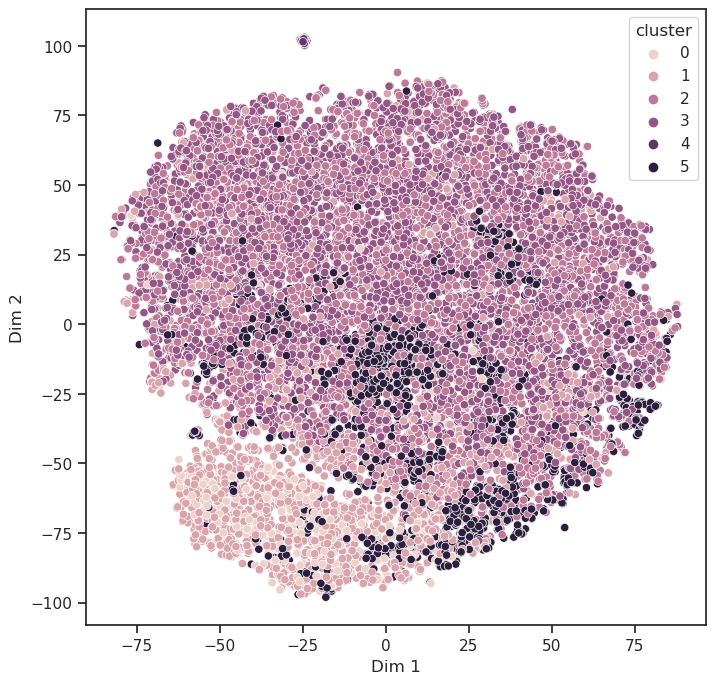

In [34]:
sb.set_style("ticks")
sb.set_context("notebook")
sb.set_palette("Paired")
plt.figure(figsize=(8, 8))

p = sb.scatterplot(x=tsne_embedding[:, 0],
 y=tsne_embedding[:, 1], 
 hue=df_processed["cluster"])

p.set_xlabel("Dim 1")
p.set_ylabel("Dim 2")

plt.show()

In [35]:
# make a dataframe to store the t-sne scores for each component alongside the sample metadata
tsne_df = pd.DataFrame(tsne_embedding, columns=["PC"+str(i) for i in range(1, tsne_embedding.shape[1]+1)])
tsne_df["cluster"] = df_processed["cluster"]

tsne_df

,PC1,PC2,cluster
0,42.127331,2.684689,2
1,-2.253859,-78.395172,5
2,-69.066093,50.015972,2
3,-42.295555,24.281839,2
4,-5.151869,-43.861145,3
...,...,...,...
15563,33.765991,48.740246,3
15564,-36.342903,80.441917,3
15565,5.367556,-34.719948,1
15566,-10.110640,-81.306252,1
